### Batch correction with Harmony for CD45+ enriched samples

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import os
import sys
import warnings
warnings.filterwarnings('ignore')


def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)


sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = './final-figures/harmony/'
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

sys.executable

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.0
anndata             0.7.5
backcall            0.2.0
cairo               1.20.0
cffi                1.14.5
constants           NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
decorator           4.4.2
get_version         2.1
google              NA
h5py                2.10.0
highs_wrapper       NA
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
jedi                0.18.0
joblib              1.0.1
kiwisolver          1.3.1
legacy_api_wrap     1.2
leidenalg           0.8.3
llvmlite            0.35.0
matplotlib          3.3.4
mpl_toolkits        NA
natsort             7.1.1
numba               0.52.0
numexpr             2.7.2
numpy               1.19.5
packaging           20.9
pandas              1.2.2
parso               0.8.1
pexpect             4.8.0
pickleshare         0.7.5
pkg_resources       NA
prompt_toolkit      3.0.16
psutil      

'/home/jovyan/my-conda-envs/scanpy_env/bin/python'

#### Load data

In [2]:
path_to_results = '/nfs/team292/vl6/immune_fetal_gonads/'

In [3]:
adata = sc.read(path_to_results + 'enriched_samples_M2doubletscores.h5ad')
adata

AnnData object with n_obs × n_vars = 35619 × 24625 
    obs: 'batch', 'batch_collection', 'cryopreserved', 'individual', 'location', 'n_counts', 'n_genes', 'percent_mito', 'process', 'sample', 'sex', 'stage', 'study', 'PCW', 'sample_source', 'doublet_score', 'doublet_score_0.75', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'n_cells-8', 'gene_ids-9', 'feature_types-9', 'n_cells-9', 'gene_ids-10', 'feature_types-10', 'n_cells-10', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'ccgs', 'individual_colors',

#### Batch correction with Harmony (batch = individual, theta = 1)

In [4]:
# Extract PCA matrix and batch array
n_pcs = 24
pca = adata.obsm['X_pca'][:, 0:(n_pcs)]
batch = adata.obs['individual']

In [5]:
%load_ext rpy2.ipython

In [6]:
%%R -i pca -i batch -o hem

library(harmony)
library(magrittr)
library(Rcpp)
set.seed(10)
hem <- HarmonyMatrix(pca, batch, theta=1, do_pca=FALSE, verbose = FALSE)
hem = data.frame(hem)

R[write to console]: Loading required package: Rcpp



In [7]:
# Add harmony values to the anndata object
adata.obsm['X_pca'] = hem.values

In [8]:
# Visualize
sc.pp.neighbors(adata, n_pcs = n_pcs)
sc.tl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 24
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:19)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:23)


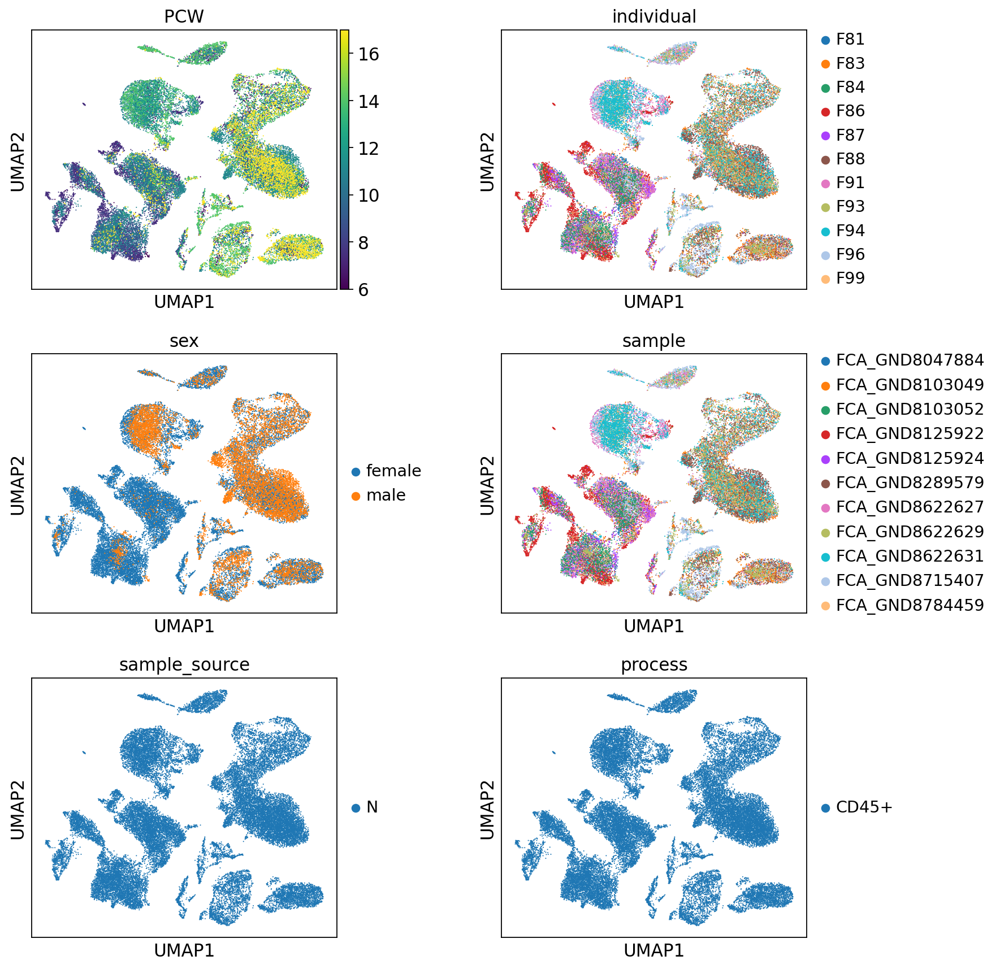

In [9]:
sc.pl.umap(adata, color=['PCW', 'individual', 'sex', 'sample', 'sample_source', 
                         'process'], save='_harmony.pdf', ncols=2, wspace = 0.4)

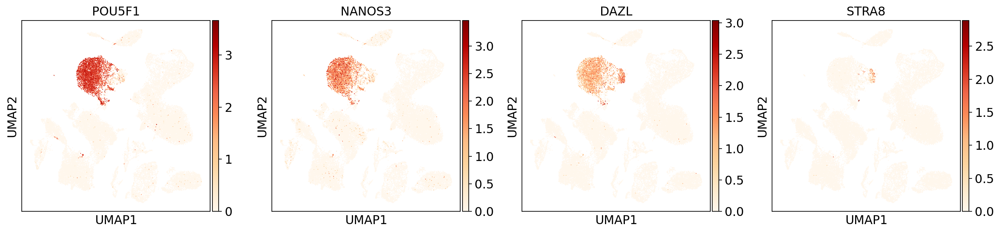

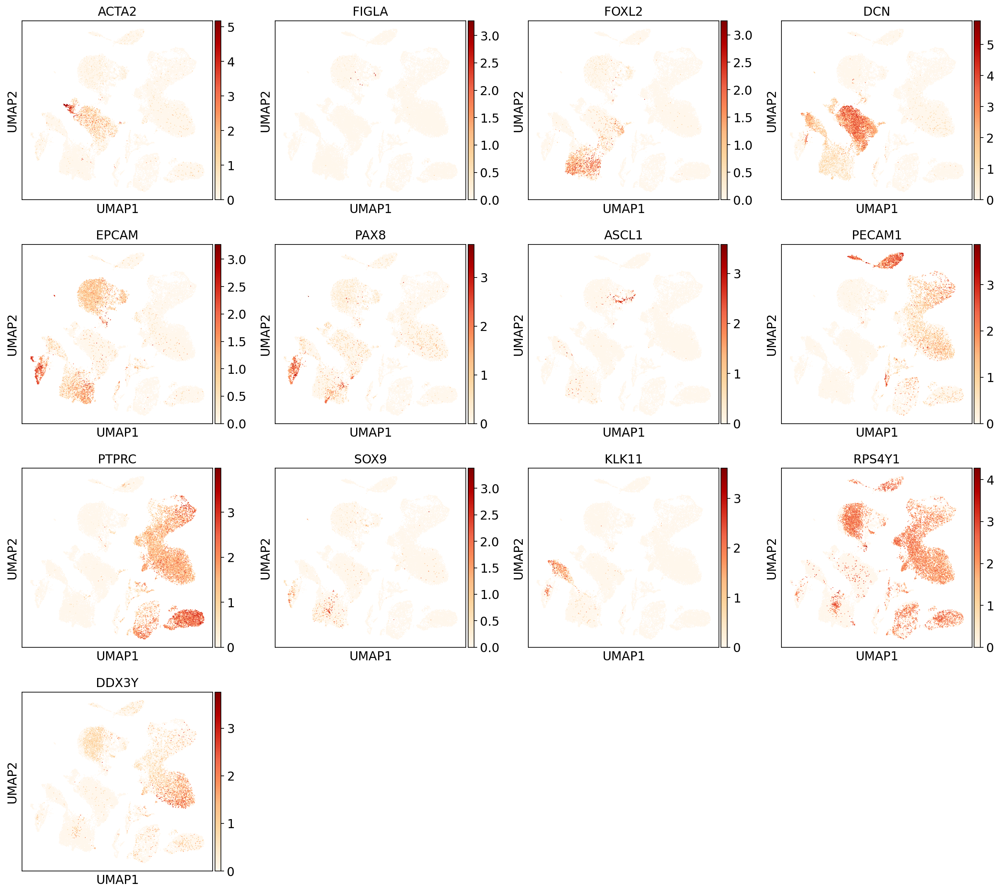

In [10]:
sc.pl.umap(adata, color=['POU5F1', 'NANOS3', 'DAZL', 'STRA8'], save='_germcells.pdf', ncols = 4, 
           color_map='OrRd', use_raw=False)

sc.pl.umap(adata, color=['ACTA2', "FIGLA", "FOXL2", "DCN", "EPCAM", "PAX8", 'ASCL1', 'PECAM1', 
                         'PTPRC', 'SOX9', 'KLK11', 'RPS4Y1','DDX3Y'], 
           save='-markers_global.pdf',color_map='OrRd', use_raw=False)

Known markers for B cells


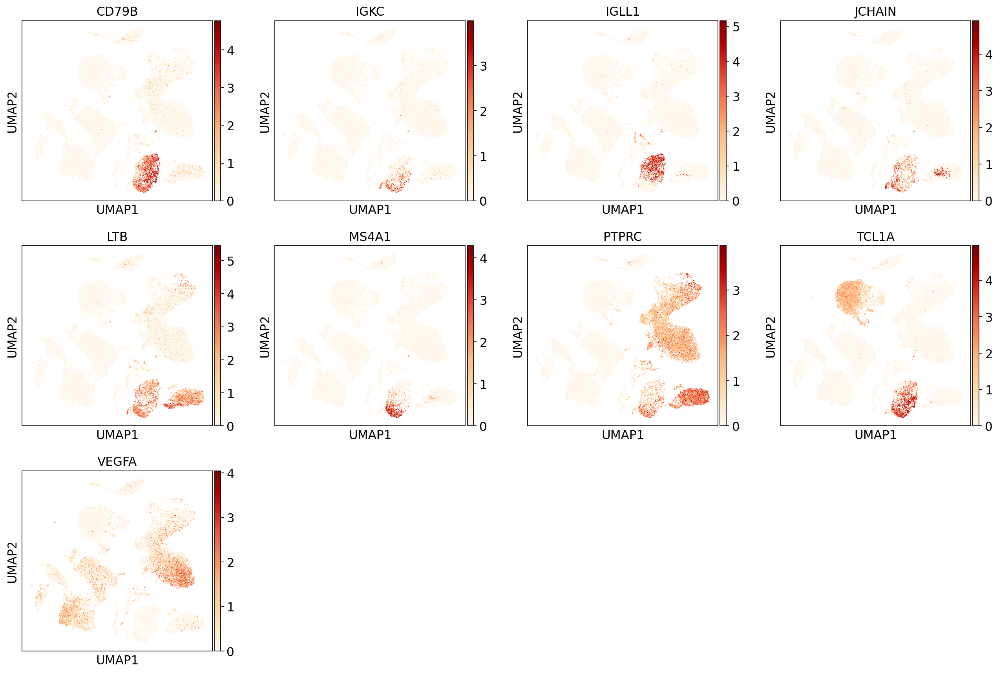

Known markers for Dendritic Cells


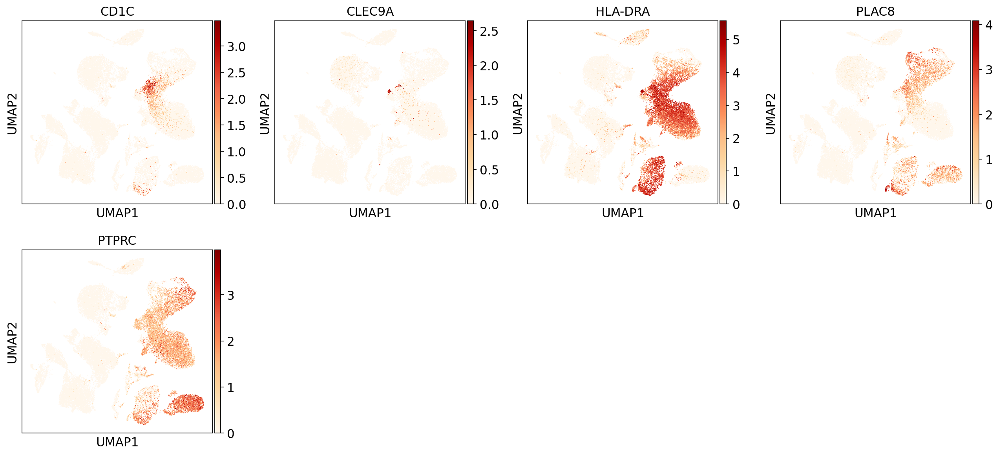

Known markers for Natural Killer cells


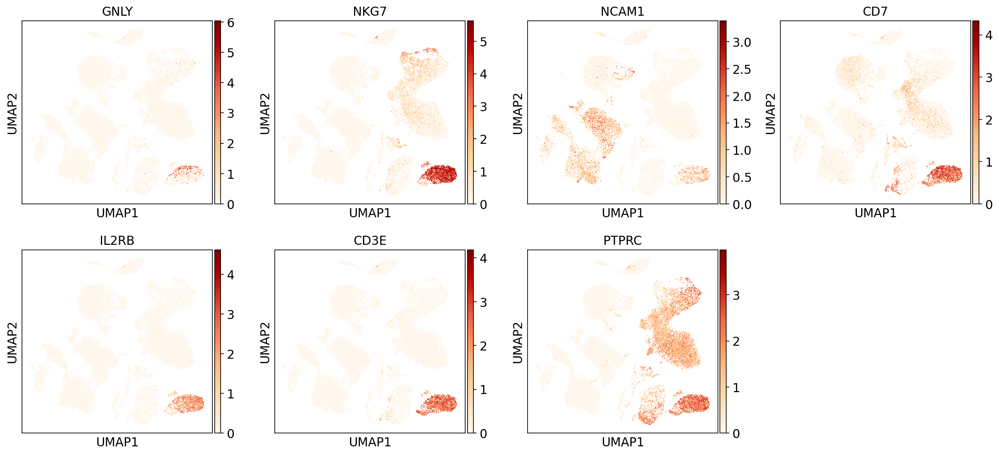

Known markers for ILC precursors


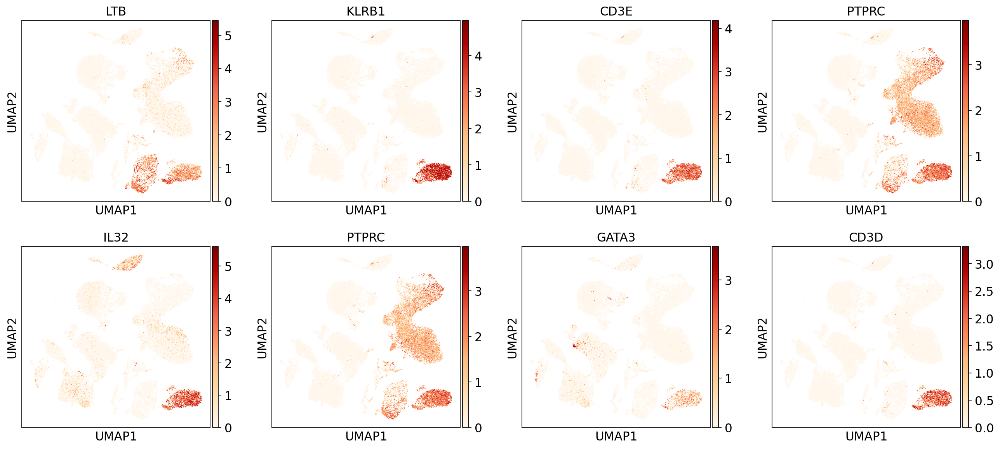

Known markers for Mast cells


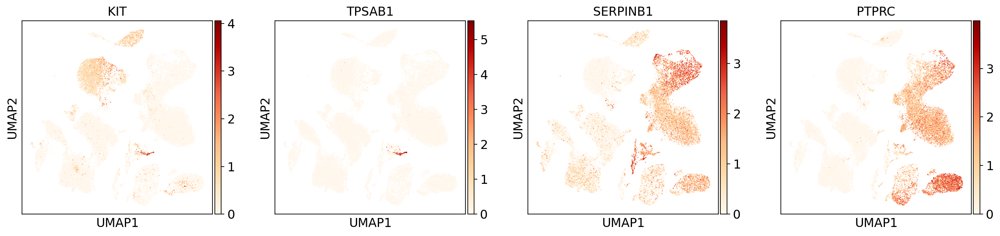

Known markers for Monocytes


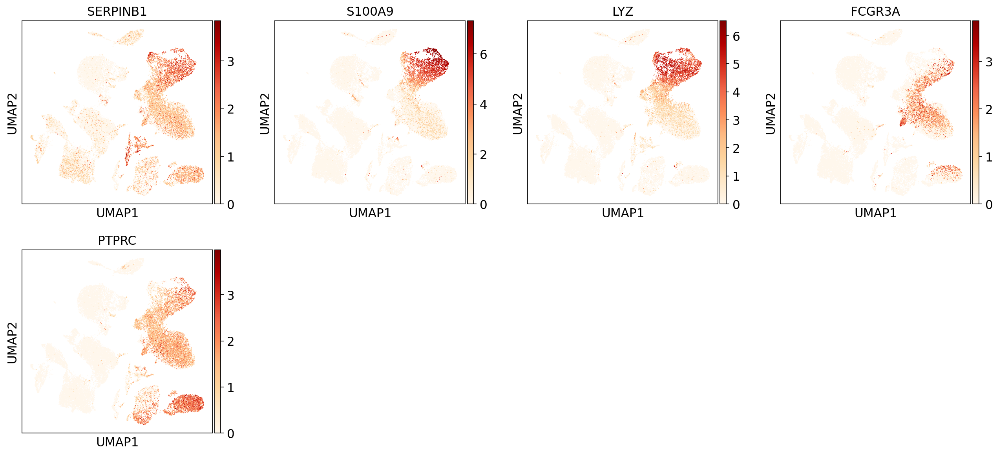

Known markers for Hematopoietic Stem Cells


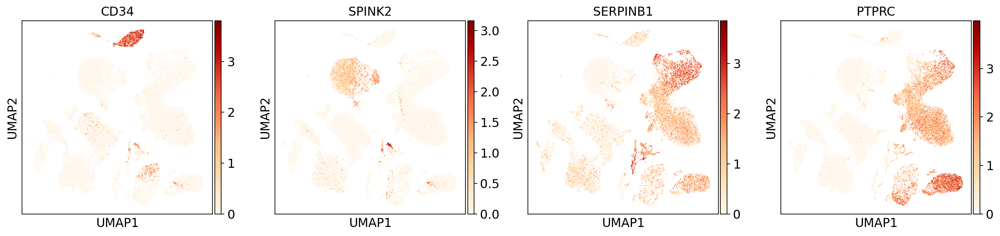

Known markers for Megakaryocytes


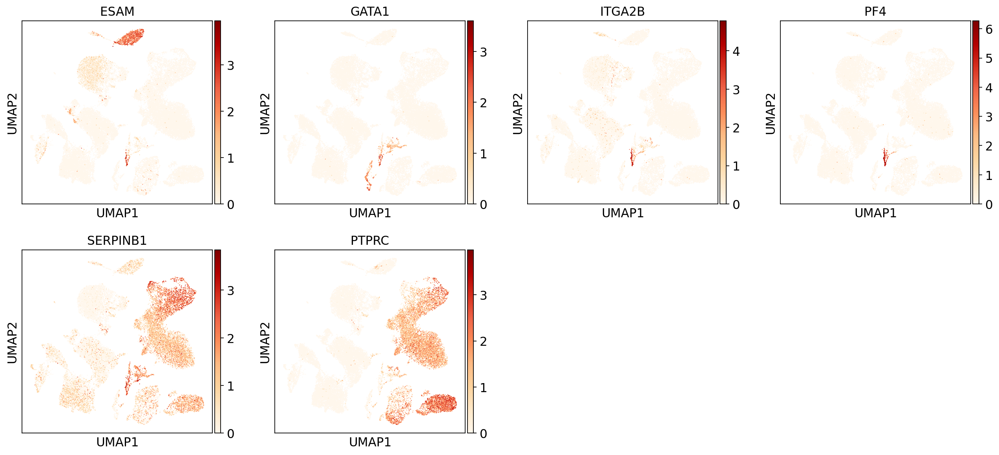

Known markers for Early Erythroid


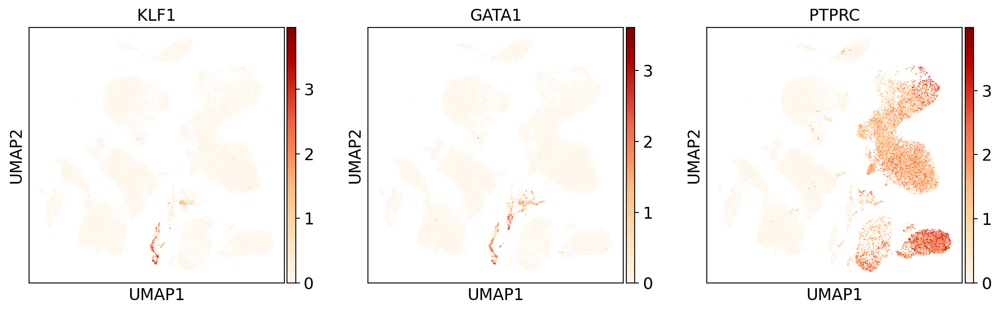

Known markers for Mid Erythroid


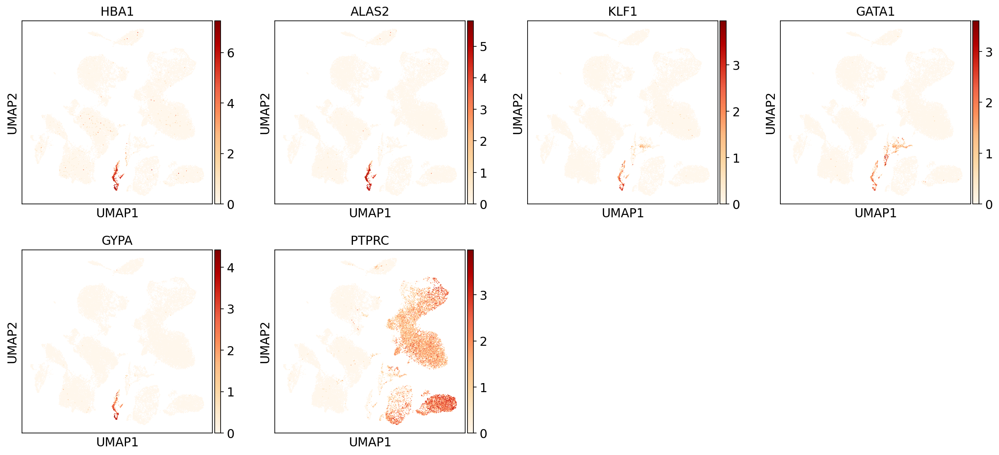

Known markers for Late Erythroid


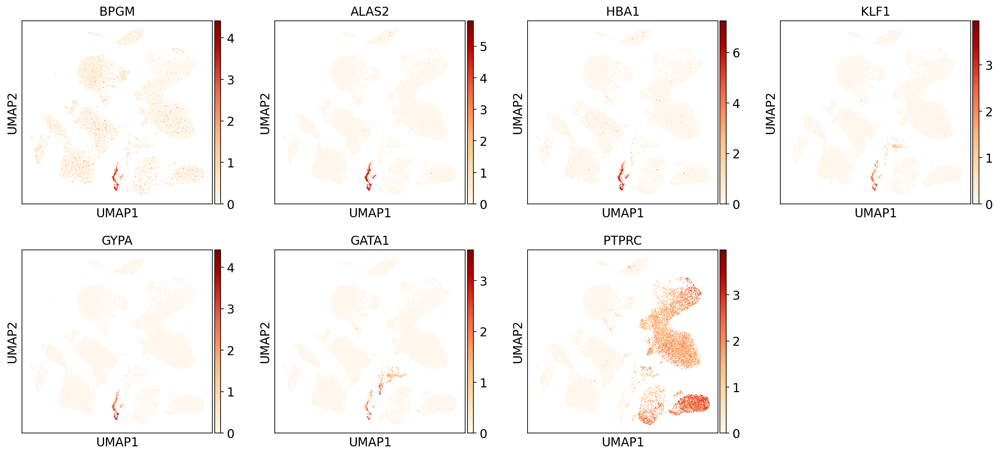

Known markers for Macrophages (broad sense)


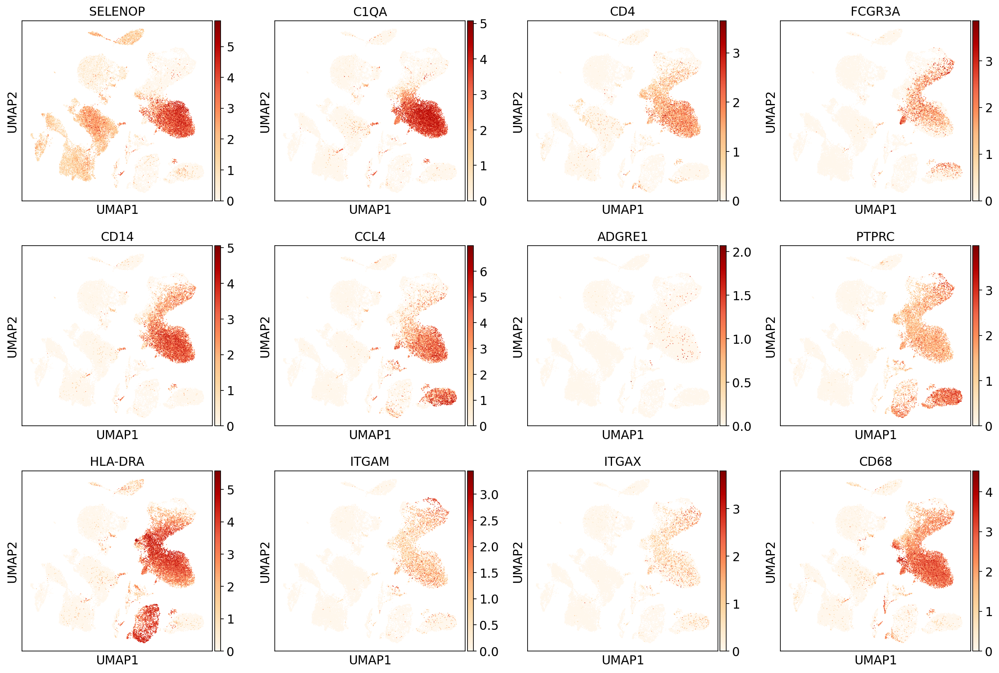

In [11]:
print('Known markers for B cells')
B_cells = np.unique(['VEGFA', 'CD79B', 'MS4A1', 'TCL1A', 'IGKC', 'JCHAIN', 'IGLL1', 'LTB', 'CD79B', 'IGLL1', 'CD79B', 
          'IGLL1', 'CD79B', 'TCL1A', 'IGKC', 'PTPRC'])
sc.pl.umap(adata, color= B_cells, color_map='OrRd', use_raw=False)

print('Known markers for Dendritic Cells')
DCs = np.unique(['CD1C', 'PLAC8', 'HLA-DRA', 'CLEC9A', 'PTPRC'])
sc.pl.umap(adata, color= DCs, color_map='OrRd', use_raw=False)

print('Known markers for Natural Killer cells')
NKs = ['GNLY', 'NKG7', 'NCAM1', 'CD7', 'IL2RB', 'CD3E', 'PTPRC']
sc.pl.umap(adata, color= NKs, color_map='OrRd', use_raw=False)

print('Known markers for ILC precursors')
ILCs = ['LTB', 'KLRB1', 'CD3E', 'PTPRC', 'IL32', 'PTPRC', 'GATA3', 'CD3D']
sc.pl.umap(adata, color= ILCs, color_map='OrRd', use_raw=False)

print('Known markers for Mast cells')
Mast = ['KIT', 'TPSAB1', 'SERPINB1', 'PTPRC']
sc.pl.umap(adata, color= Mast, color_map='OrRd', use_raw=False)

print('Known markers for Monocytes')
Monocytes = ['SERPINB1', 'S100A9', 'LYZ', 'FCGR3A', 'PTPRC']
sc.pl.umap(adata, color= Monocytes, color_map='OrRd', use_raw=False)

print('Known markers for Hematopoietic Stem Cells')
HSCs = ['CD34', 'SPINK2', 'SERPINB1', 'PTPRC']
sc.pl.umap(adata, color= HSCs, color_map='OrRd', use_raw=False)

print('Known markers for Megakaryocytes')
Megakaryocytes = ['ESAM', 'GATA1', 'ITGA2B', 'PF4', 'SERPINB1', 'PTPRC']
sc.pl.umap(adata, color= Megakaryocytes, color_map='OrRd', use_raw=False)

print('Known markers for Early Erythroid')
Early_erythroid = ['KLF1', 'GATA1', 'PTPRC']
sc.pl.umap(adata, color= Early_erythroid, color_map='OrRd', use_raw=False)

print('Known markers for Mid Erythroid') 
Mid_erythroid = ['HBA1', 'ALAS2', 'KLF1', 'GATA1', 'GYPA', 'PTPRC']
sc.pl.umap(adata, color= Mid_erythroid, color_map='OrRd', use_raw=False)

print('Known markers for Late Erythroid')
Late_erythroid = ['BPGM', 'ALAS2', 'HBA1', 'KLF1', 'GYPA', 'GATA1', 'PTPRC'] # less KLF1 and GATA1 
sc.pl.umap(adata, color= Late_erythroid, color_map='OrRd', use_raw=False)

print('Known markers for Macrophages (broad sense)')
Macrophages = ['SELENOP', 'C1QA', 'CD4', 'FCGR3A', 'CD14', 'CCL4', 'ADGRE1', 'PTPRC', 'HLA-DRA', 'ITGAM', 'ITGAX', 'CD68']
sc.pl.umap(adata, color= Macrophages, color_map='OrRd', use_raw=False)

#### Select immune cells based on expression of CD45 and canonical immune markers

running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:12)


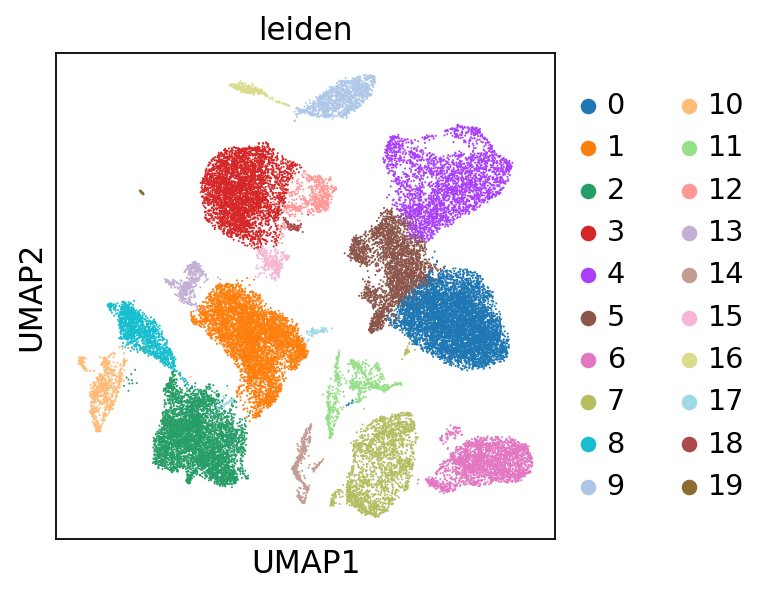

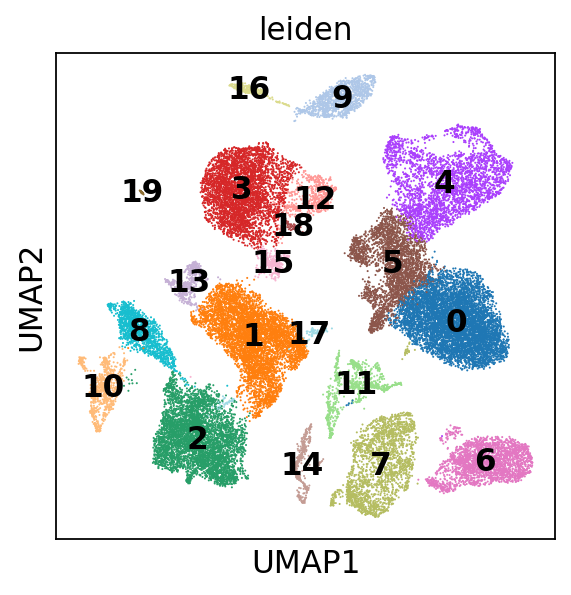

In [12]:
sc.tl.leiden(adata, resolution=0.5, random_state = 1234)
sc.pl.umap(adata, color='leiden',save='_clustering.pdf')
sc.pl.umap(adata, color='leiden',legend_loc='on data',save='_clustering_clusnumbers.pdf')

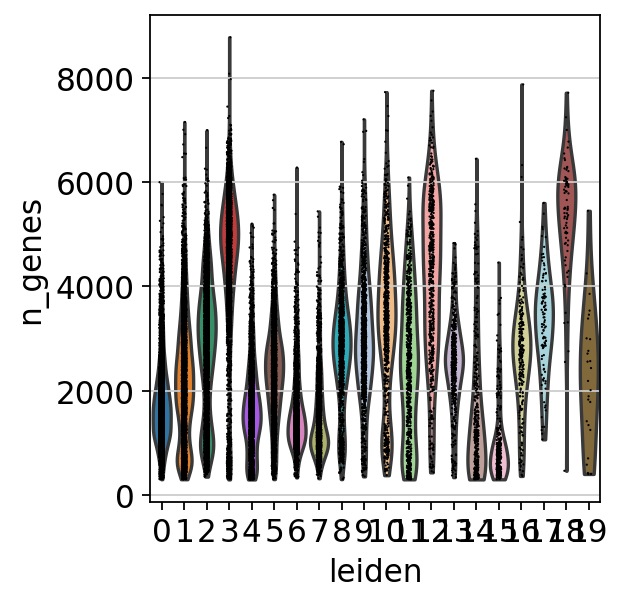

In [13]:
sc.pl.violin(adata, keys = 'n_genes', groupby = 'leiden')

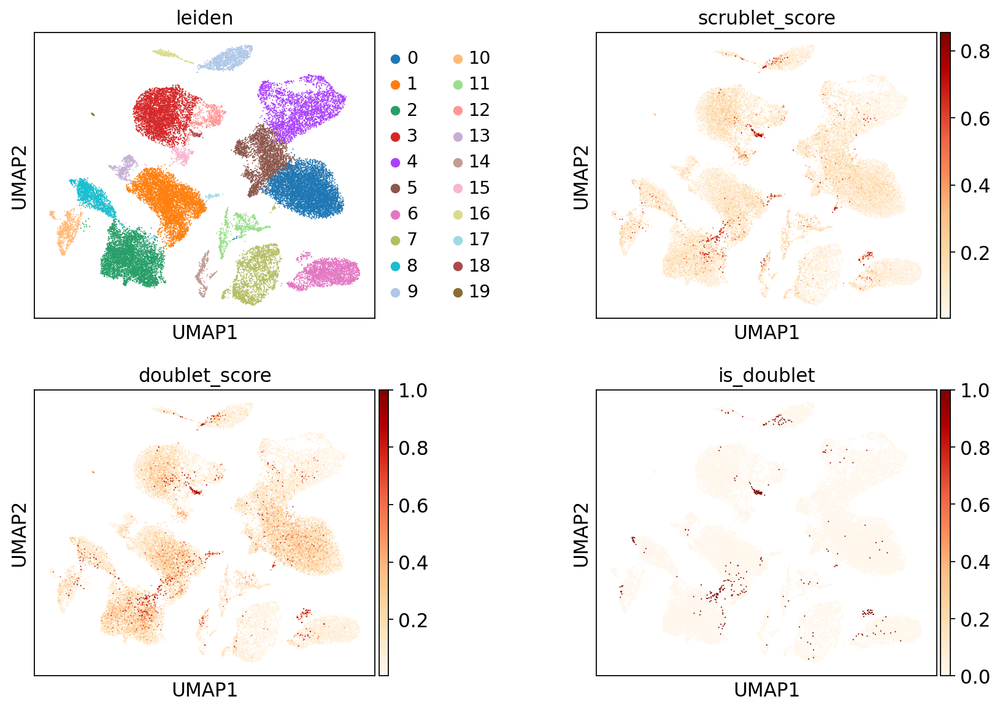

In [15]:
sc.pl.umap(adata, color = ['leiden', 'scrublet_score', 'doublet_score', 'is_doublet'], 
           ncols = 2, color_map = 'OrRd', wspace = 0.5)

In [16]:
adata = adata[~adata.obs['is_doublet'], :]
adata.shape

(35299, 24625)

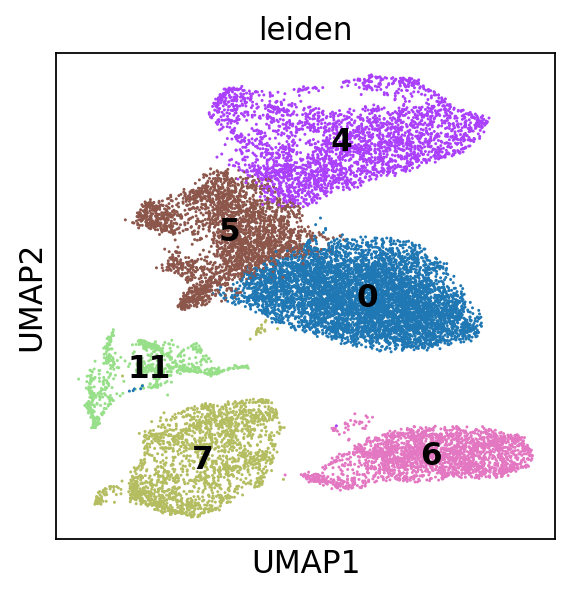

In [17]:
immune = adata[[i in ['6', '7', '0', '4', '5', '11'] for i in adata.obs['leiden']]]
sc.pl.umap(immune, color = "leiden", legend_loc = 'on data')

#### Save immune cells from CD45+ enriched samples

In [18]:
immune.write(path_to_results + 'immune_enriched_samples.h5ad')

#### End of notebook